# Install libraries

In [ ]:
pip install ultralytics matplotlib pillow opencv-python-headless roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.9/906.9 kB 35.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.1 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
Note: you may need to restart the kernel to use updated packages.


# Import libraries

In [ ]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from roboflow import Roboflow
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')


image = cv2.imread("/kaggle/input/new-test-data/benign-107-_png.rf.c7dd030b2e5f10df48fd38f66860b886.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
The image has dimensions 640x640 and 3 channels.


# YOLOv8, YOLOv9, and YOLOv11 configuration

In [ ]:
model = YOLO("yolo11n.yaml")  # build a new model from YAML
model = YOLO("yolo11n.pt")  # load a pretrained model (recommended for training)
model = YOLO("yolo11n.yaml").load("yolo11n.pt")  # build from YAML and transfer weights

100%|██████████| 5.35M/5.35M [00:00<00:00, 187MB/s]


Transferred 499/499 items from pretrained weights


In [ ]:
# Build a YOLOv9c model from scratch
model = YOLO("yolov9c.yaml")

# Build a YOLOv9c model from pretrained weight
model = YOLO("yolov9c.pt")

100%|██████████| 49.4M/49.4M [00:00<00:00, 84.4MB/s]


100%|██████████| 6.25M/6.25M [00:00<00:00, 195MB/s]



image 1/1 /kaggle/input/new-test-data/benign-107-_png.rf.c7dd030b2e5f10df48fd38f66860b886.jpg: 640x640 1 cat, 6.3ms
Speed: 7.0ms preprocess, 6.3ms inference, 170.1ms postprocess per image at shape (1, 3, 640, 640)


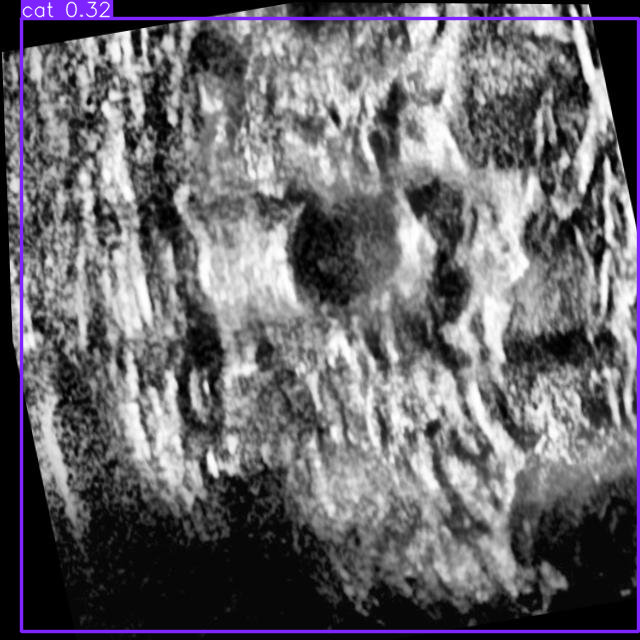

In [ ]:
model = YOLO("yolov8n.pt")
# Use the model to detect object
image = "/kaggle/input/new-test-data/benign-107-_png.rf.c7dd030b2e5f10df48fd38f66860b886.jpg"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

# Fine-tuning process log of YOLOv8, YOLOv9, and YOLOv11

In [ ]:
from roboflow import Roboflow
from ultralytics import YOLO

# Step 1: Initialize Roboflow with your API key
rf = Roboflow(api_key="WUrpdqz7TdJflBASJxy3")

# Step 2: Access your project and version
project = rf.workspace("cse438").project("breast-cancer-csbzx")
version = project.version(1)

# Step 3: Download the dataset in YOLOv8 format
dataset = version.download("yolov8")

# Step 4: Initialize YOLOv8 model and load weights
print("Initializing YOLOv8 model...")
yolo_v8_model = YOLO('yolov8n.yaml')  # You can change this to other YOLOv8 configurations if necessary

# Step 5: Start training YOLOv8 on the dataset
print("Training YOLOv8 model...")
yolo_v8_model.train(
    data=dataset.location + '/data.yaml',  # Path to the dataset YAML file
    epochs=25,                             # Number of epochs for training
    imgsz=640,                             # Image size (resize all images to 640px for training)
    batch=16,                              # Batch size for training
    lr0=0.01,                              # Learning rate
    dropout=0.15,                          # Dropout rate (to prevent overfitting)
    device=0                                # Use GPU (set to 'cpu' if you want to train on CPU)
)

# Step 6: Training is complete, and the model is saved
print("YOLOv8 Model training complete!")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Breast-Cancer-1 in yolov8:: 100%|██████████| 3838/3838 [00:00<00:00, 6479.66it/s]


Initializing YOLOv8 model...
Training YOLOv8 model...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/kaggle/working/Breast-Cancer-1/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=Fals

100%|██████████| 755k/755k [00:00<00:00, 47.7MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/Breast-Cancer-1/train/labels... 1674 images, 123 backgrounds, 0 corrupt: 100%|██████████| 1674/1674 [00:01<00:00, 1182.56it/s]


train: New cache created: /kaggle/working/Breast-Cancer-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/Breast-Cancer-1/valid/labels... 159 images, 21 backgrounds, 0 corrupt: 100%|██████████| 159/159 [00:00<00:00, 1446.78it/s]

val: New cache created: /kaggle/working/Breast-Cancer-1/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      2.39G      2.871      3.327      3.923         28        640: 100%|██████████| 105/105 [00:21<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]


                   all        159        150      0.509        0.5      0.253     0.0535

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      2.34G      1.988      2.596      2.793         30        640: 100%|██████████| 105/105 [00:19<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.70it/s]

                   all        159        150      0.798      0.364      0.318      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      2.34G      1.256       1.75      1.962         27        640: 100%|██████████| 105/105 [00:19<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.65it/s]

                   all        159        150      0.885      0.452      0.418      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      2.35G     0.9346      1.367      1.618         30        640: 100%|██████████| 105/105 [00:19<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.82it/s]

                   all        159        150      0.834      0.453      0.384      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      2.35G     0.7472      1.134      1.414         30        640: 100%|██████████| 105/105 [00:19<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.03it/s]

                   all        159        150       0.36      0.458      0.424      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      2.35G     0.6284     0.9751      1.315         29        640: 100%|██████████| 105/105 [00:19<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.80it/s]

                   all        159        150      0.359        0.5      0.425      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      2.34G     0.5661     0.9045      1.253         33        640: 100%|██████████| 105/105 [00:18<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.81it/s]

                   all        159        150      0.847      0.398      0.373      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      2.35G     0.5191     0.8687      1.211         26        640: 100%|██████████| 105/105 [00:18<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.13it/s]

                   all        159        150      0.864      0.483      0.433      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      2.35G     0.4879     0.8316      1.185         31        640: 100%|██████████| 105/105 [00:18<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.03it/s]

                   all        159        150      0.867      0.483      0.437      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      2.35G     0.4438     0.8031      1.152         31        640: 100%|██████████| 105/105 [00:19<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.83it/s]

                   all        159        150      0.397      0.516      0.425      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      2.34G     0.4221     0.7433      1.143         28        640: 100%|██████████| 105/105 [00:18<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.99it/s]

                   all        159        150      0.638      0.526      0.438      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      2.34G     0.4224     0.7701      1.129         29        640: 100%|██████████| 105/105 [00:19<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.85it/s]

                   all        159        150      0.394      0.527      0.428      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      2.35G     0.4149     0.7223      1.128         31        640: 100%|██████████| 105/105 [00:19<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.67it/s]

                   all        159        150      0.415      0.547       0.44      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      2.35G     0.3691     0.7085        1.1         32        640: 100%|██████████| 105/105 [00:18<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.97it/s]

                   all        159        150      0.463      0.625      0.491      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      2.34G     0.3727     0.7021      1.099         29        640: 100%|██████████| 105/105 [00:19<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.81it/s]

                   all        159        150      0.474      0.652      0.489      0.428


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      2.34G      0.338       0.76      1.179         10        640: 100%|██████████| 105/105 [00:20<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.68it/s]

                   all        159        150      0.375      0.527      0.429      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      2.35G     0.3052     0.6884      1.148          9        640: 100%|██████████| 105/105 [00:18<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.78it/s]

                   all        159        150      0.488      0.683      0.533      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      2.35G     0.2763     0.6274      1.116         10        640: 100%|██████████| 105/105 [00:19<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.87it/s]

                   all        159        150      0.519      0.652      0.537      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      2.34G     0.2603     0.6173      1.106         11        640: 100%|██████████| 105/105 [00:18<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.80it/s]

                   all        159        150      0.524      0.679      0.568      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      2.35G     0.2575     0.5976      1.097         12        640: 100%|██████████| 105/105 [00:18<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.04it/s]

                   all        159        150      0.528       0.75      0.601      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      2.35G     0.2488     0.5779      1.093          9        640: 100%|██████████| 105/105 [00:18<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.82it/s]

                   all        159        150      0.576      0.683      0.576      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      2.35G     0.2487     0.5685      1.091         10        640: 100%|██████████| 105/105 [00:18<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.60it/s]

                   all        159        150      0.569      0.671      0.623       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      2.34G     0.2321     0.5602      1.087         11        640: 100%|██████████| 105/105 [00:18<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.61it/s]

                   all        159        150      0.502      0.699      0.566      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      2.35G     0.2276     0.5275      1.067          9        640: 100%|██████████| 105/105 [00:19<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.84it/s]

                   all        159        150      0.565      0.676      0.612      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      2.35G     0.2248     0.5204      1.075          8        640: 100%|██████████| 105/105 [00:18<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.76it/s]

                   all        159        150      0.574      0.698      0.624      0.537



25 epochs completed in 0.145 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8n summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.40it/s]


                   all        159        150      0.567       0.68      0.612      0.542
                benign        118        118      0.734      0.984      0.874      0.874
             malignant         32         32        0.4      0.375      0.351      0.211
Speed: 0.2ms preprocess, 2.0ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/train
YOLOv8 Model training complete!


In [ ]:
from roboflow import Roboflow
from ultralytics import YOLO

# Step 1: Initialize Roboflow with your API key
rf = Roboflow(api_key="WUrpdqz7TdJflBASJxy3")

# Step 2: Access your project and version
project = rf.workspace("cse438").project("breast-cancer-csbzx")
version = project.version(1)

# Step 3: Download the dataset in YOLOv9 format (assuming YOLOv9 format is supported in the future)
dataset = version.download("yolov9")  # Change "yolov8" to "yolov9" if available

# Step 4: Initialize YOLOv9 model and load weights (assuming YOLOv9 configuration exists)
print("Initializing YOLOv9 model...")
yolo_v9_model = YOLO('yolov9c.yaml')  # Change the configuration file if necessary (hypothetical)

# Step 5: Start training YOLOv9 on the dataset
print("Training YOLOv9 model...")
yolo_v9_model.train(
    data=dataset.location + '/data.yaml',  # Path to the dataset YAML file
    epochs=25,                             # Number of epochs for training
    imgsz=640,                             # Image size (resize all images to 640px for training)
    batch=16,                              # Batch size for training
    lr0=0.01,                              # Learning rate
    dropout=0.15,                          # Dropout rate (to prevent overfitting)
    device=0                                # Use GPU (set to 'cpu' if you want to train on CPU)
)

# Step 6: Training is complete, and the model is saved
print("YOLOv9 Model training complete!")

loading Roboflow workspace...
loading Roboflow project...
Initializing YOLOv9 model...
Training YOLOv9 model...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.yaml, data=/kaggle/working/Breast-Cancer-1/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fals

train: Scanning /kaggle/working/Breast-Cancer-1/train/labels.cache... 1674 images, 123 backgrounds, 0 corrupt: 100%|██████████| 1674/1674 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/Breast-Cancer-1/valid/labels.cache... 159 images, 21 backgrounds, 0 corrupt: 100%|██████████| 159/159 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25        12G      2.635      2.993      3.683         28        640: 100%|██████████| 105/105 [01:36<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.70it/s]

                   all        159        150      0.515        0.5      0.148     0.0316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      11.9G      1.459      1.726      2.287         30        640: 100%|██████████| 105/105 [01:34<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.70it/s]

                   all        159        150      0.795      0.419      0.333      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      11.9G      1.012      1.267      1.741         27        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.70it/s]

                   all        159        150      0.693      0.267      0.234      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25        12G     0.8632      1.112      1.531         30        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]

                   all        159        150      0.803      0.441      0.351      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25        12G     0.6812     0.9528      1.354         30        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.69it/s]

                   all        159        150      0.852      0.445      0.429      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25        12G     0.5973     0.8613      1.278         29        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]

                   all        159        150      0.383      0.543      0.421       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      11.8G     0.5167     0.8099      1.211         33        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.70it/s]

                   all        159        150       0.86      0.445      0.445      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25        12G     0.4866     0.7893      1.185         26        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.70it/s]

                   all        159        150      0.843      0.483      0.382      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25        12G      0.461     0.7571      1.159         31        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.406      0.527      0.423      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25        12G     0.4265     0.7364      1.133         31        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.438      0.558      0.465      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      11.8G     0.3948     0.6657      1.112         28        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.423      0.558      0.472      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25        12G     0.3804     0.6772      1.094         29        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.469      0.625      0.522      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25        12G     0.3753     0.6589      1.097         31        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]

                   all        159        150      0.456      0.641      0.483      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25        12G     0.3548     0.6523       1.08         32        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.508       0.63      0.465      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      11.9G     0.3456     0.6328      1.071         29        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.488      0.672      0.474      0.441


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      11.9G     0.3119     0.6728      1.138         10        640: 100%|██████████| 105/105 [01:34<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]

                   all        159        150      0.484      0.672      0.526      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25        12G     0.2851     0.6074      1.106          9        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]

                   all        159        150      0.454      0.688       0.48      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25        12G     0.2638     0.5724      1.085         10        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.486      0.641      0.483       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      11.9G     0.2547      0.569      1.084         11        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]

                   all        159        150       0.46      0.778      0.538       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25        12G      0.242     0.5455      1.072         12        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.522      0.672      0.552      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25        12G     0.2293     0.5268      1.062          9        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.494      0.766      0.572      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25        12G     0.2281     0.5134      1.056         10        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.519      0.652      0.571      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      11.8G     0.2175     0.5113      1.057         11        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.498      0.734      0.551      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25        12G     0.2131     0.4948      1.048          9        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        159        150      0.541      0.766      0.585      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25        12G     0.2107     0.4818      1.047          8        640: 100%|██████████| 105/105 [01:33<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]

                   all        159        150      0.535      0.766      0.589      0.535



25 epochs completed in 0.687 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 51.6MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 51.6MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv9c summary (fused): 384 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.41it/s]


                   all        159        150      0.535      0.766      0.589      0.534
                benign        118        118      0.736          1      0.834      0.834
             malignant         32         32      0.334      0.531      0.344      0.235
Speed: 0.2ms preprocess, 15.7ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/train2
YOLOv9 Model training complete!


In [ ]:
from roboflow import Roboflow
from ultralytics import YOLO

# Step 1: Initialize Roboflow with your API key
rf = Roboflow(api_key="WUrpdqz7TdJflBASJxy3")

# Step 2: Access your project and version
project = rf.workspace("cse438").project("breast-cancer-csbzx")
version = project.version(1)

# Step 3: Download the dataset in YOLOv8 format
dataset = version.download("yolov11")

# Step 4: Initialize YOLOv8 model and load weights
print("Initializing YOLOv11 model...")
yolo_v11_model = YOLO('yolo11n.yaml')  # You can change this to other YOLOv11 configurations if necessary

# Step 5: Start training YOLOv11 on the dataset
print("Training YOLOv11 model...")
yolo_v11_model.train(
    data=dataset.location + '/data.yaml',  # Path to the dataset YAML file
    epochs=25,                             # Number of epochs for training
    imgsz=640,                             # Image size (resize all images to 640px for training)
    batch=16,                              # Batch size for training
    lr0=0.01,                              # Learning rate
    dropout=0.15,                          # Dropout rate (to prevent overfitting)
    device=0                                # Use GPU (set to 'cpu' if you want to train on CPU)
)

# Step 6: Training is complete, and the model is saved
print("YOLOv11 Model training complete!")

loading Roboflow workspace...
loading Roboflow project...
Initializing YOLOv11 model...
Training YOLOv11 model...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.yaml, data=/kaggle/working/Breast-Cancer-1/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fa

train: Scanning /kaggle/working/Breast-Cancer-1/train/labels.cache... 1674 images, 123 backgrounds, 0 corrupt: 100%|██████████| 1674/1674 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/Breast-Cancer-1/valid/labels.cache... 159 images, 21 backgrounds, 0 corrupt: 100%|██████████| 159/159 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 


# Training performance metrics

Visualizing metrics for YOLOv8 (train)


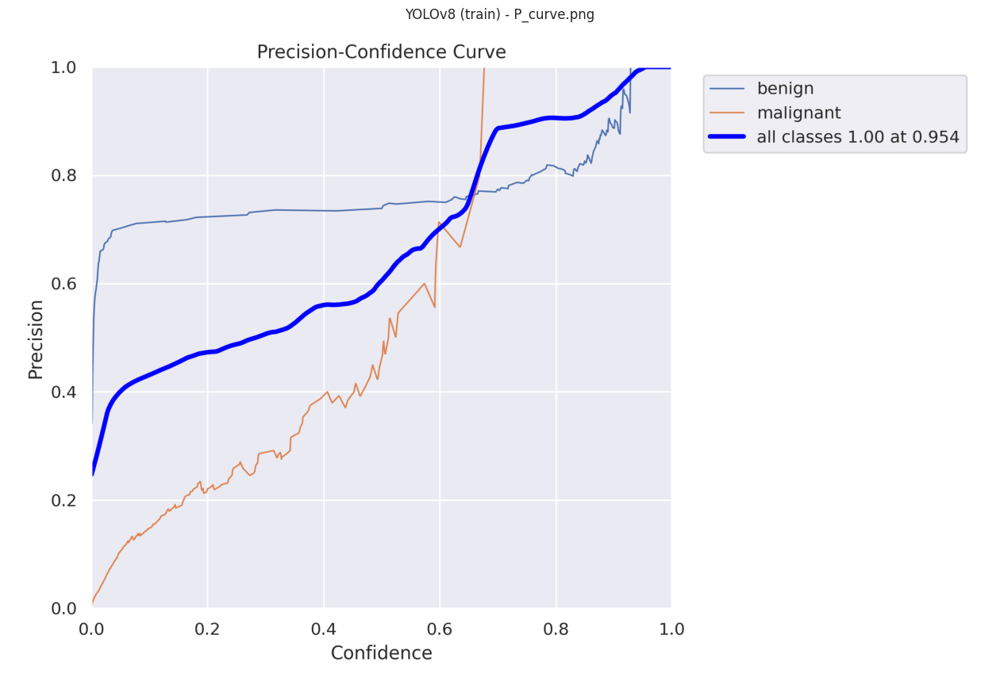

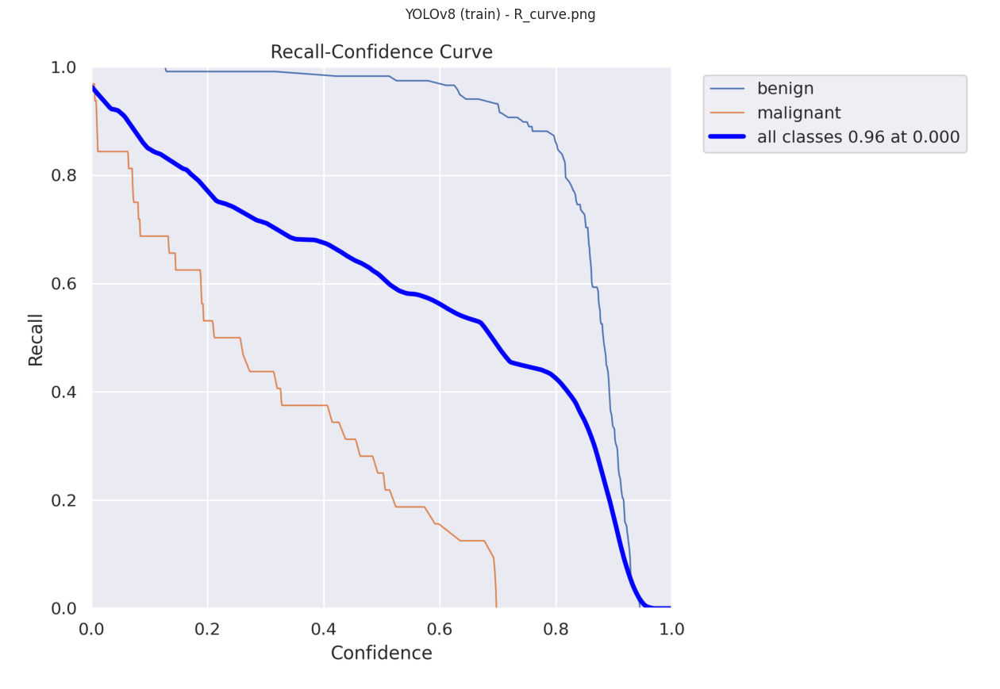

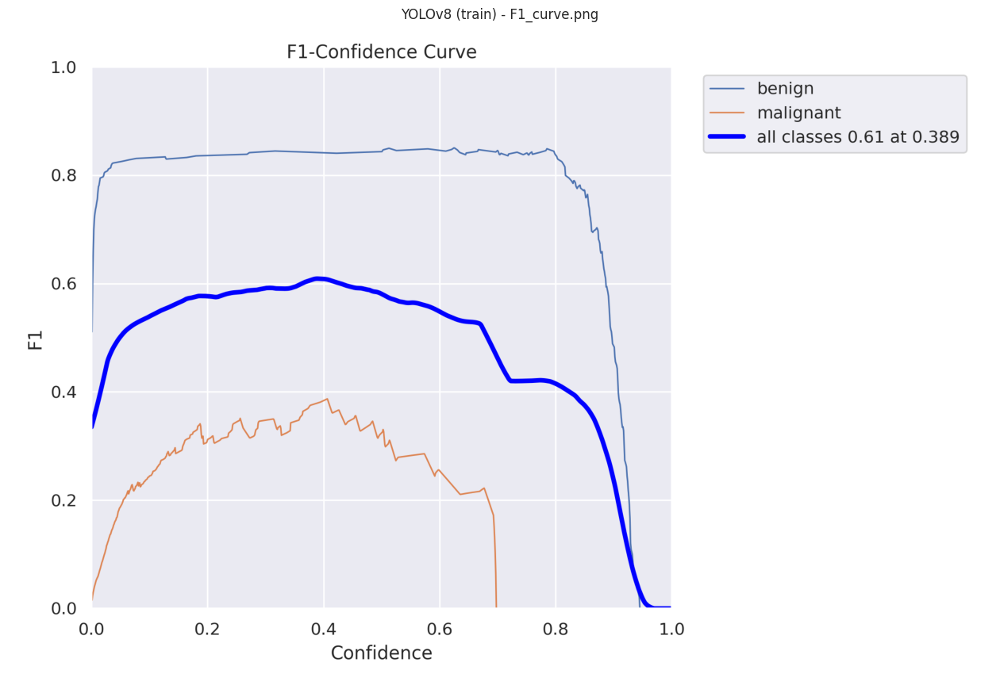

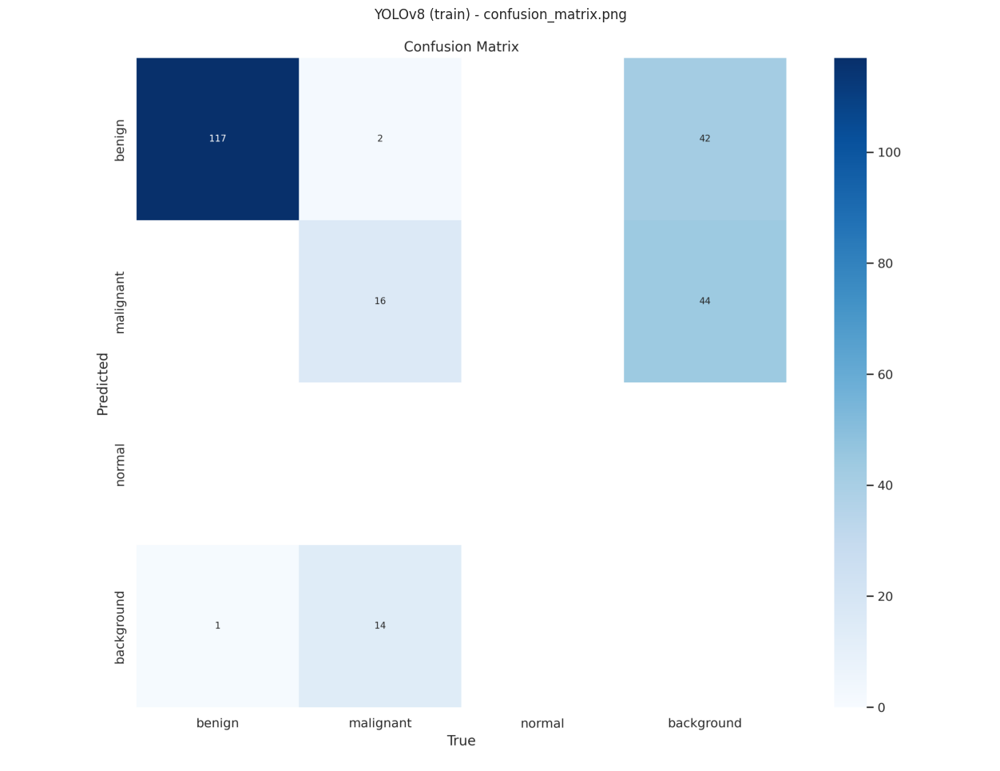

Visualizing metrics for YOLOv9 (train2)


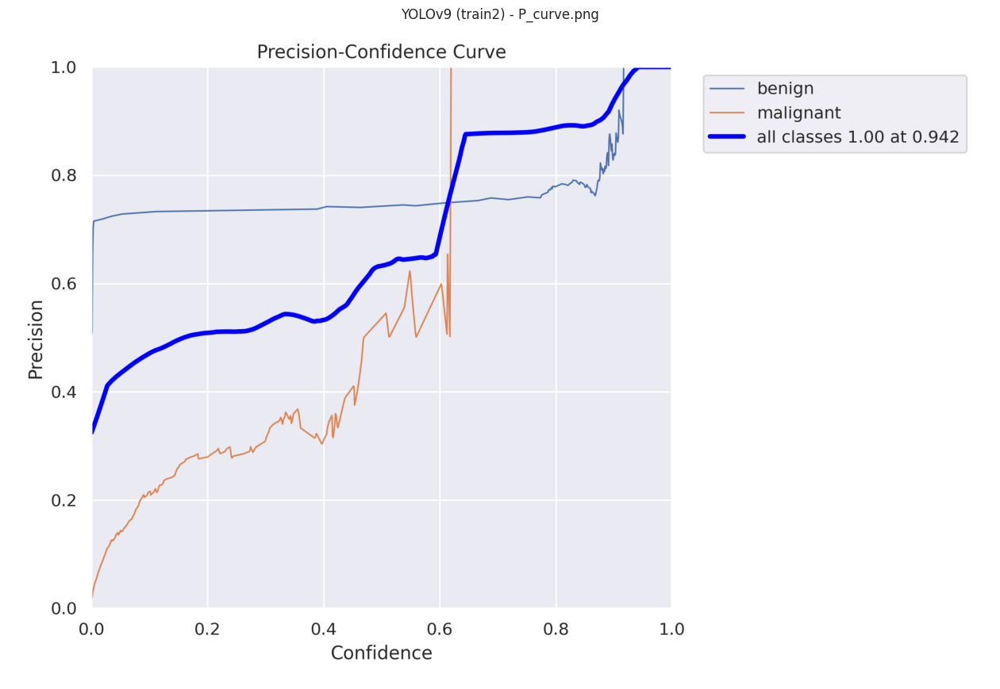

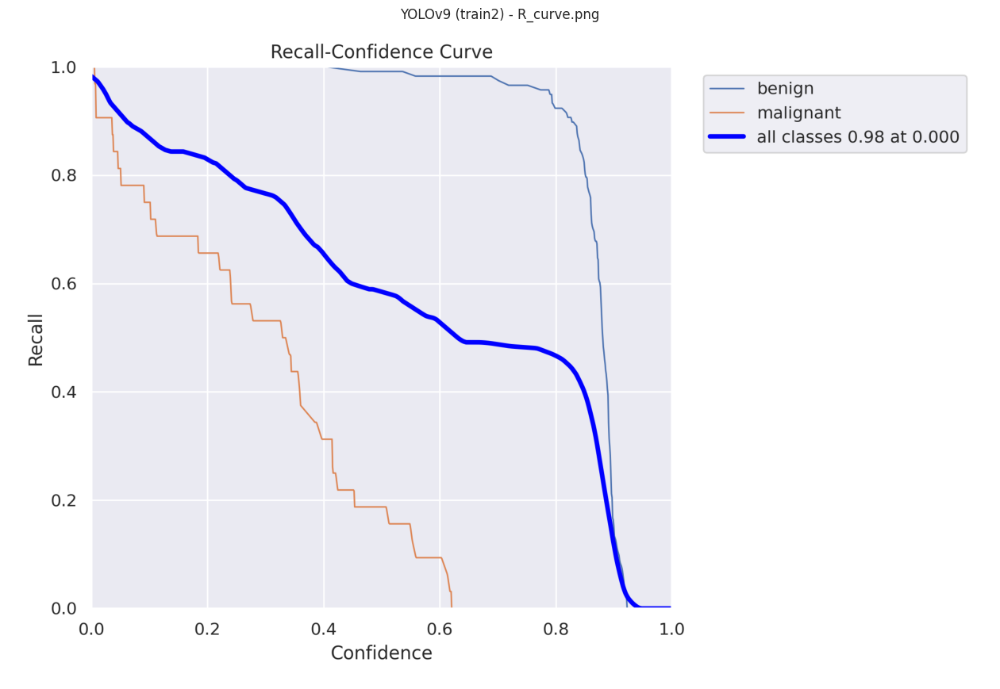

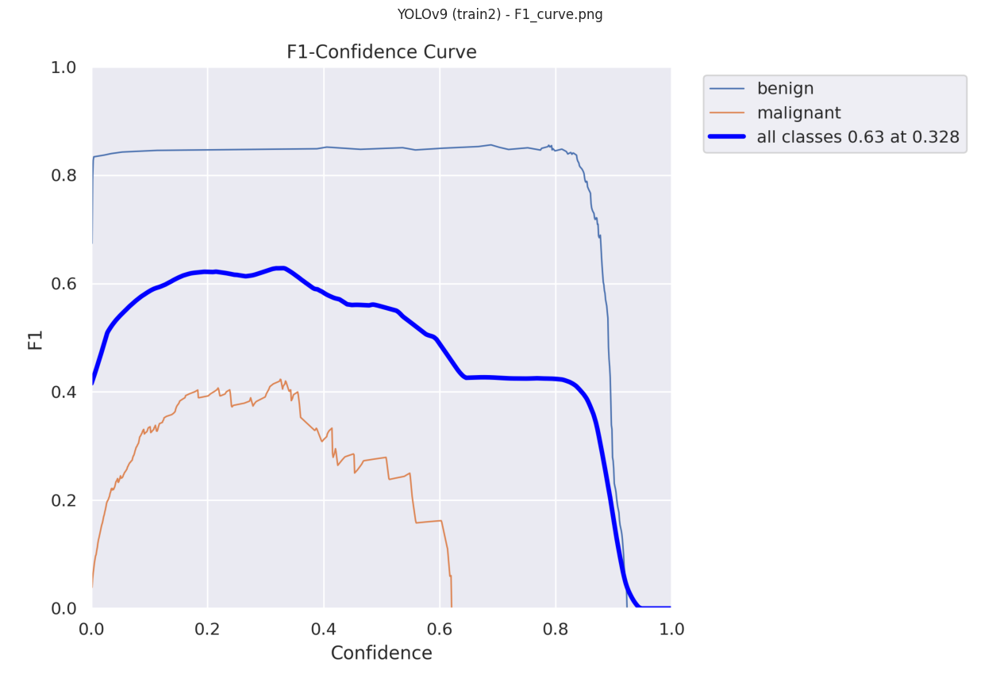

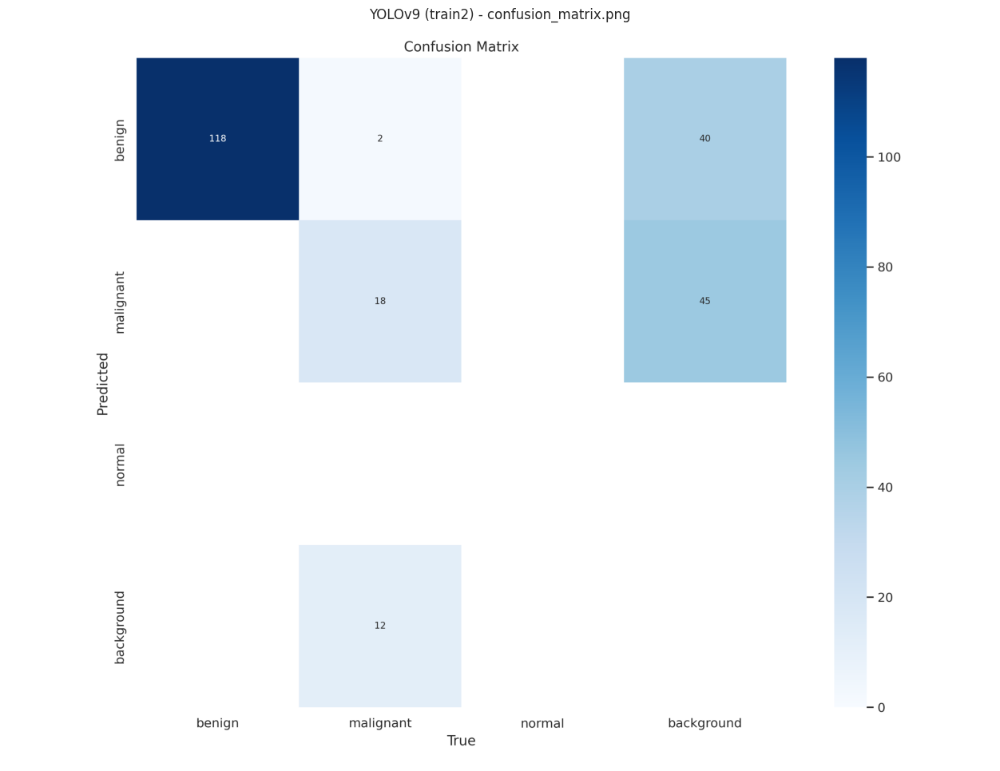

Visualizing metrics for YOLOv11 (train3)


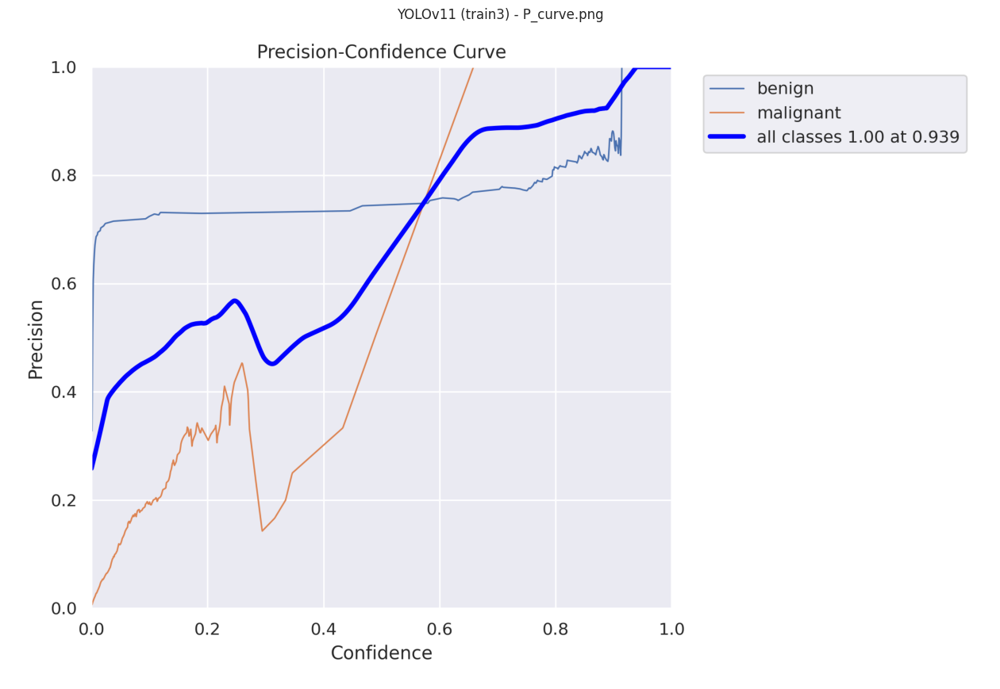

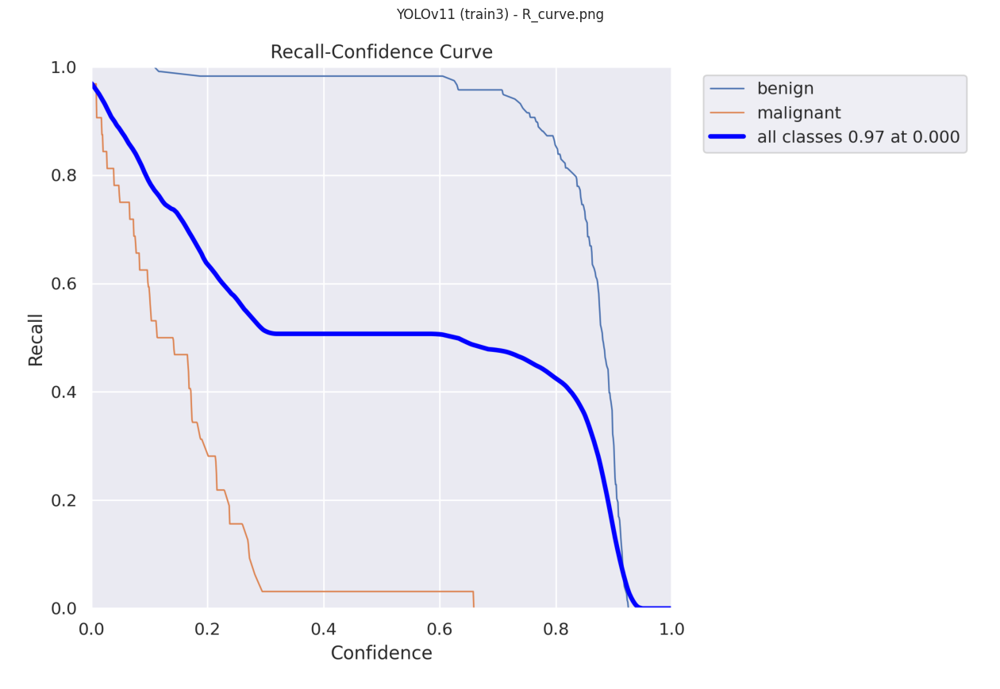

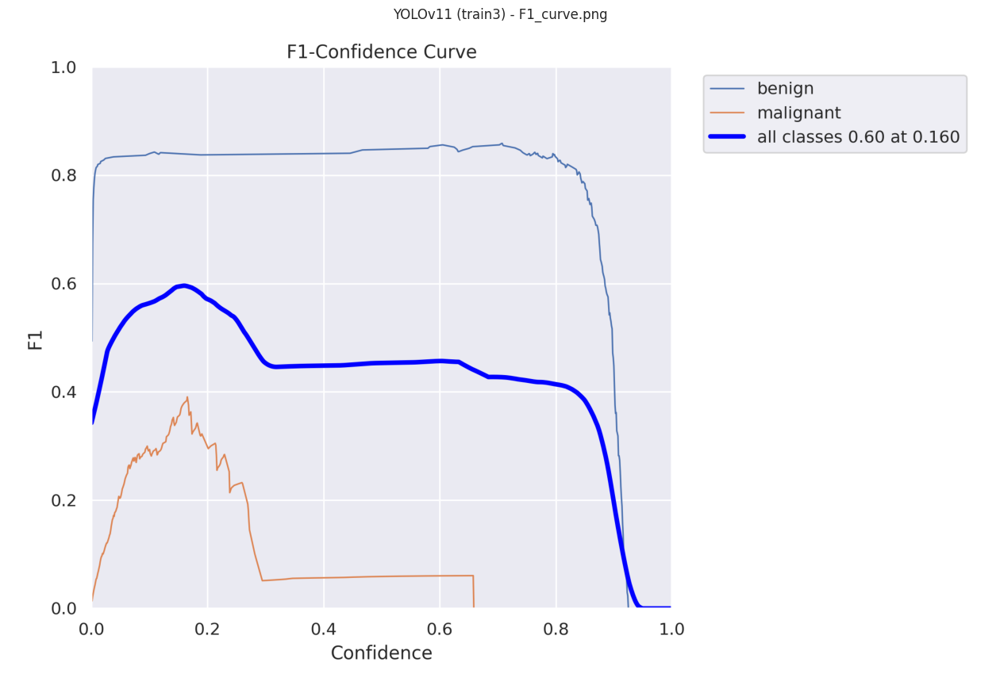

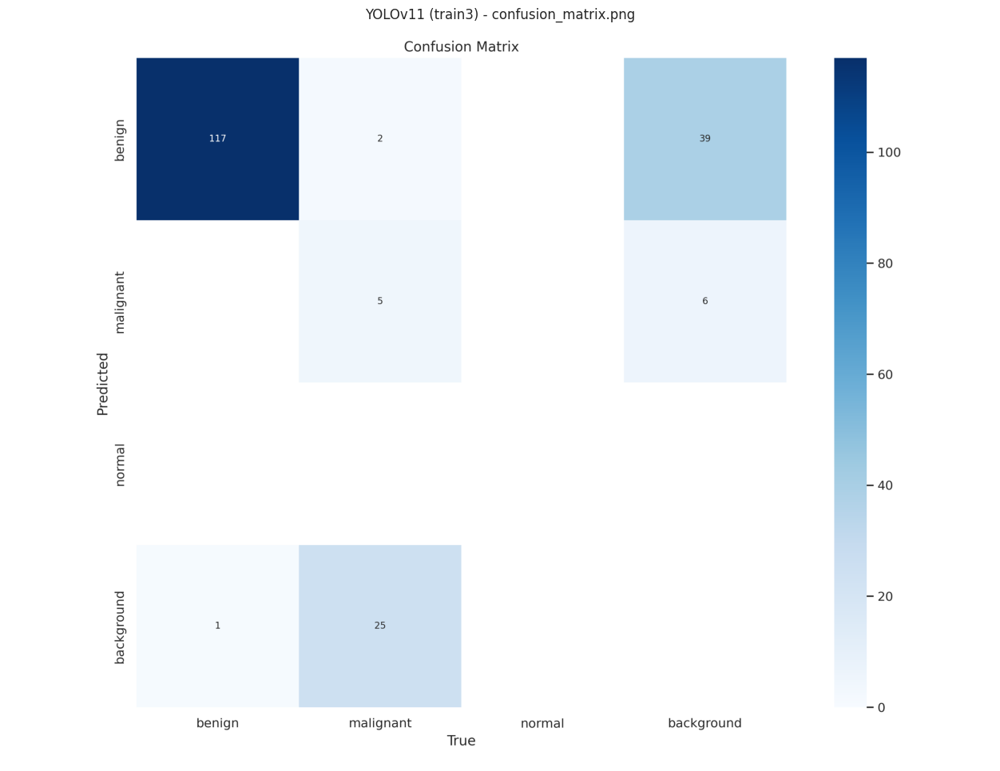

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# List of metric file names
list_of_metrics = ["P_curve.png", "R_curve.png", "F1_curve.png", "confusion_matrix.png"]

# Define paths for the models with their corresponding names
models = {
    "YOLOv8 (train)": "/kaggle/working/runs/detect/train/",
    "YOLOv9 (train2)": "/kaggle/working/runs/detect/train2/",  # YOLOv9 with train2
    "YOLOv11 (train3)": "/kaggle/working/runs/detect/train3/"
}

# Loop through each model and display metrics
for model_name, model_path in models.items():
    print(f"Visualizing metrics for {model_name}")
    for metric in list_of_metrics:
        # Load the image
        img = cv2.imread(f"{model_path}{metric}")
        if img is not None:  # Ensure the image exists
            # Convert the color from BGR to RGB for correct display
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            # Plot the image
            plt.figure(figsize=(16, 12))
            plt.title(f"{model_name} - {metric}")
            plt.imshow(img)
            plt.axis("off")
            plt.show()
        else:
            print(f"Metric {metric} not found in {model_path}")

In [ ]:
import pandas as pd

# Define the paths for the results.csv files for each model
model_results = {
    "YOLOv8 (train)": "/kaggle/working/runs/detect/train/results.csv",
    "YOLOv9 (train2)": "/kaggle/working/runs/detect/train2/results.csv",  # Added YOLOv9
    "YOLOv11 (train3)": "/kaggle/working/runs/detect/train3/results.csv"
}

# Loop through each model, load the CSV, and display the head
for model_name, results_path in model_results.items():
    print(f"Results for {model_name}:\n")
    try:
        results = pd.read_csv(results_path)
        display(results.head())  # Display the first 5 rows
    except FileNotFoundError:
        print(f"File not found: {results_path}")
    print("-" * 80)  # Separator

Results for YOLOv8 (train):



,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,26.1913,2.87080,3.32706,3.92293,0.50853,0.50000,0.25301,0.05350,2.66327,3.71336,3.77313,0.000472,0.000472,0.000472
1,2,47.3475,1.98812,2.59611,2.79310,0.79816,0.36441,0.31800,0.26871,1.27657,2.13798,2.08372,0.000911,0.000911,0.000911
2,3,68.0191,1.25565,1.75034,1.96160,0.88458,0.45181,0.41752,0.37306,0.86242,2.39254,1.41877,0.001312,0.001312,0.001312
3,4,88.6076,0.93460,1.36697,1.61814,0.83427,0.45298,0.38416,0.34374,0.82332,1.65307,1.32595,0.001259,0.001259,0.001259
4,5,109.1470,0.74723,1.13416,1.41450,0.35954,0.45763,0.42397,0.40303,0.69790,1.39555,1.11346,0.001203,0.001203,0.001203


--------------------------------------------------------------------------------
Results for YOLOv9 (train2):



,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,107.528,2.63540,2.99309,3.68343,0.51468,0.50000,0.14836,0.03164,1.74115,3.49924,3.12802,0.000472,0.000472,0.000472
1,2,206.753,1.45899,1.72571,2.28653,0.79455,0.41916,0.33340,0.25344,1.27418,2.37257,2.05449,0.000911,0.000911,0.000911
2,3,305.553,1.01214,1.26749,1.74120,0.69288,0.26695,0.23378,0.11553,1.91679,4.02192,2.46618,0.001312,0.001312,0.001312
3,4,403.838,0.86318,1.11204,1.53122,0.80324,0.44068,0.35053,0.23736,1.10489,1.64242,1.62501,0.001259,0.001259,0.001259
4,5,502.147,0.68117,0.95284,1.35353,0.85208,0.44492,0.42863,0.37100,0.72095,1.59659,1.08432,0.001203,0.001203,0.001203


--------------------------------------------------------------------------------
Results for YOLOv11 (train3):



,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,29.0993,2.93676,3.51170,4.02766,0.00516,0.64062,0.21600,0.03273,3.03780,3.26887,3.78958,0.000472,0.000472,0.000472
1,2,53.9007,2.21416,2.73497,2.94652,0.74174,0.29661,0.30628,0.13394,1.49090,2.60149,2.47613,0.000911,0.000911,0.000911
2,3,78.0320,1.43934,1.92793,2.12795,0.83375,0.44492,0.37885,0.31744,1.16211,1.74372,1.74517,0.001312,0.001312,0.001312
3,4,101.8190,1.02544,1.35806,1.68587,0.70199,0.40254,0.22273,0.10646,1.48932,2.51151,2.20921,0.001259,0.001259,0.001259
4,5,125.7390,0.79816,1.08898,1.44939,0.84790,0.46610,0.37818,0.33966,0.90186,1.53538,1.36050,0.001203,0.001203,0.001203


--------------------------------------------------------------------------------


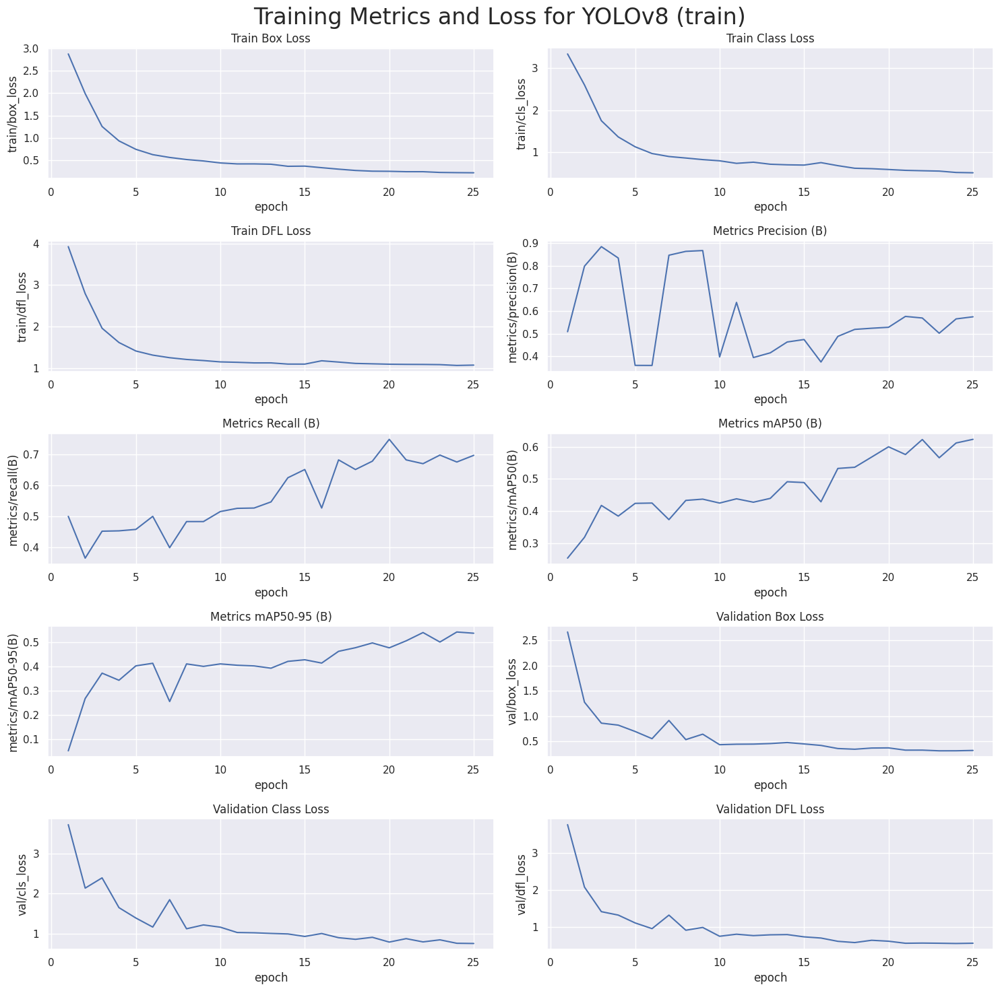

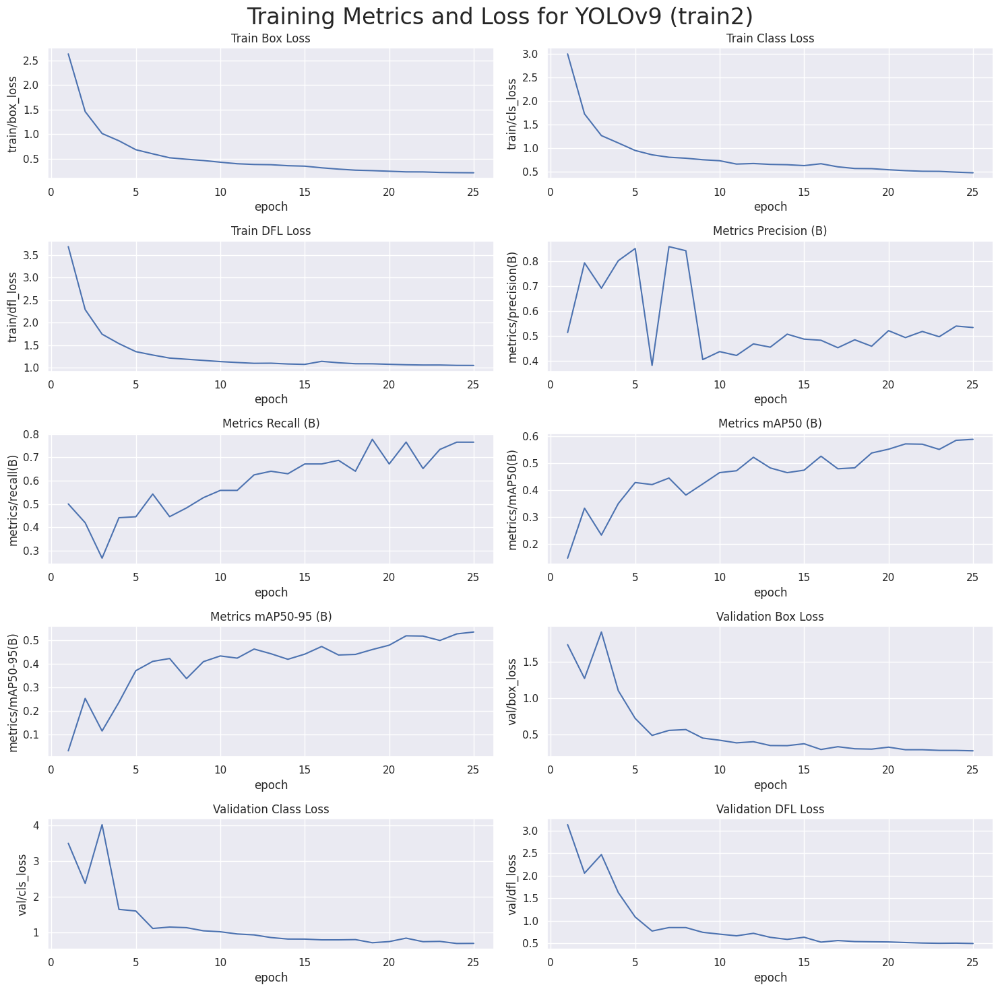

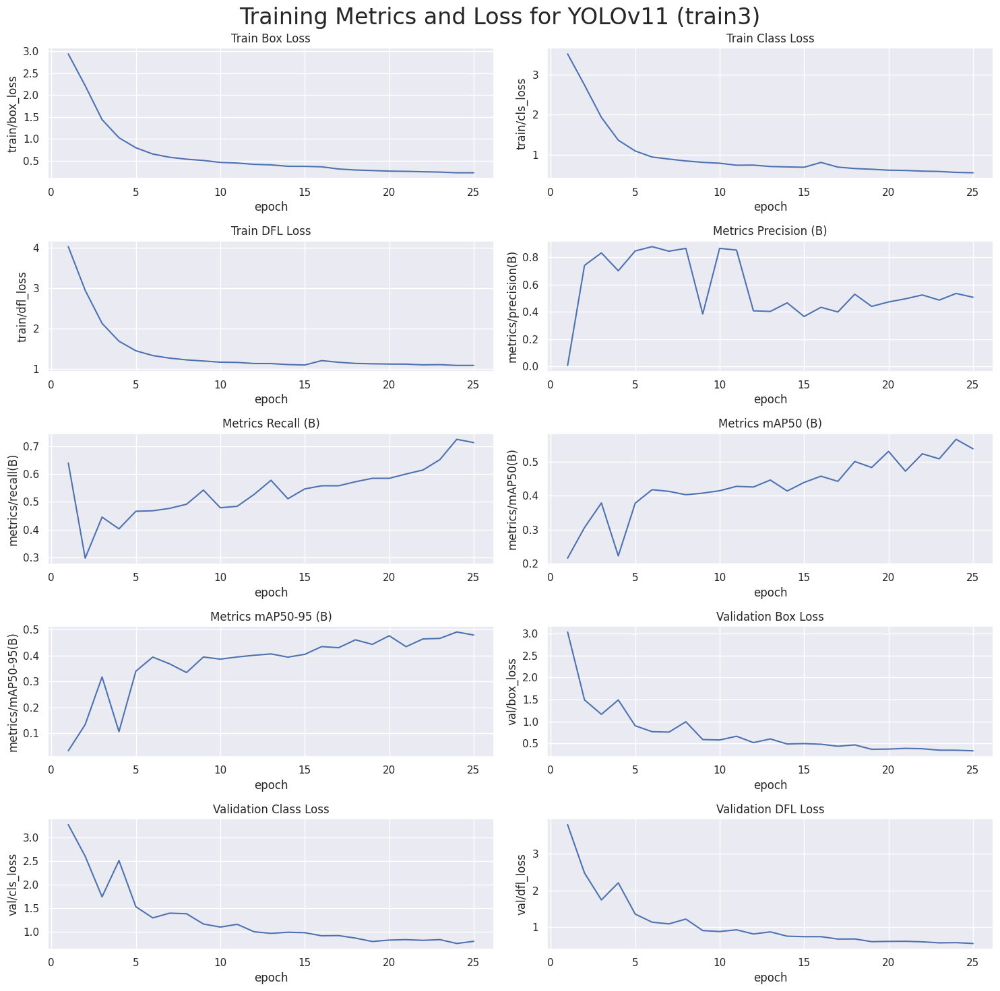

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define paths for the models with their corresponding names
models = {
    "YOLOv8 (train)": "/kaggle/working/runs/detect/train/results.csv",
    "YOLOv9 (train2)": "/kaggle/working/runs/detect/train2/results.csv",  # Added YOLOv9
    "YOLOv11 (train3)": "/kaggle/working/runs/detect/train3/results.csv"
}

# Loop through each model, load the results, and plot the metrics
for model_name, results_path in models.items():
    try:
        # Load results
        results = pd.read_csv(results_path)
        results.columns = results.columns.str.strip()

        # Create subplots
        fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

        # Plot the columns using seaborn
        sns.lineplot(x='epoch', y='train/box_loss', data=results, ax=axs[0,0])
        sns.lineplot(x='epoch', y='train/cls_loss', data=results, ax=axs[0,1])
        sns.lineplot(x='epoch', y='train/dfl_loss', data=results, ax=axs[1,0])
        sns.lineplot(x='epoch', y='metrics/precision(B)', data=results, ax=axs[1,1])
        sns.lineplot(x='epoch', y='metrics/recall(B)', data=results, ax=axs[2,0])
        sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=results, ax=axs[2,1])
        sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=results, ax=axs[3,0])
        sns.lineplot(x='epoch', y='val/box_loss', data=results, ax=axs[3,1])
        sns.lineplot(x='epoch', y='val/cls_loss', data=results, ax=axs[4,0])
        sns.lineplot(x='epoch', y='val/dfl_loss', data=results, ax=axs[4,1])

        # Set titles and axis labels for each subplot
        axs[0,0].set(title='Train Box Loss')
        axs[0,1].set(title='Train Class Loss')
        axs[1,0].set(title='Train DFL Loss')
        axs[1,1].set(title='Metrics Precision (B)')
        axs[2,0].set(title='Metrics Recall (B)')
        axs[2,1].set(title='Metrics mAP50 (B)')
        axs[3,0].set(title='Metrics mAP50-95 (B)')
        axs[3,1].set(title='Validation Box Loss')
        axs[4,0].set(title='Validation Class Loss')
        axs[4,1].set(title='Validation DFL Loss')

        # Set the overall title
        plt.suptitle(f'Training Metrics and Loss for {model_name}', fontsize=24)
        plt.subplots_adjust(top=0.9)
        plt.tight_layout()
        plt.show()
    except FileNotFoundError:
        print(f"Results file not found for {model_name}: {results_path}")

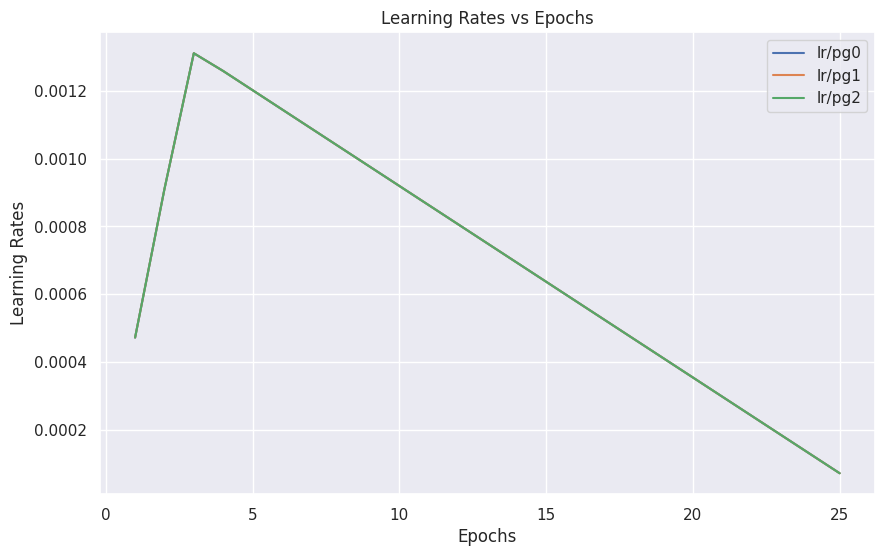

In [ ]:
# Plotting Learning Rates for all groups (lr/pg0, lr/pg1, lr/pg2)
plt.figure(figsize=(10, 6))
sns.lineplot(x='epoch', y='lr/pg0', data=results, label='lr/pg0')
sns.lineplot(x='epoch', y='lr/pg1', data=results, label='lr/pg1')
sns.lineplot(x='epoch', y='lr/pg2', data=results, label='lr/pg2')
plt.title('Learning Rates vs Epochs')
plt.xlabel('Epochs')
plt.ylabel('Learning Rates')
plt.legend()
plt.show()

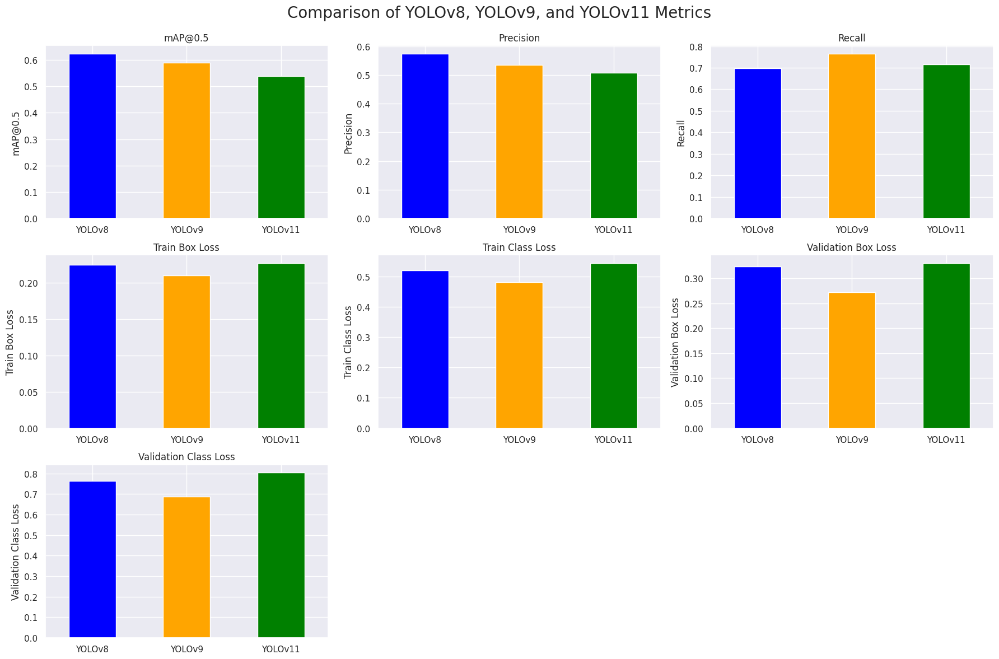

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the file paths for YOLOv8, YOLOv9, and YOLOv11 results
results_v8_path = "/kaggle/working/runs/detect/train/results.csv"
results_v9_path = "/kaggle/working/runs/detect/train2/results.csv"  # Path for YOLOv9
results_v11_path = "/kaggle/working/runs/detect/train3/results.csv"

# Load results into DataFrames
results_v8 = pd.read_csv(results_v8_path)
results_v9 = pd.read_csv(results_v9_path)  # Loading YOLOv9 results
results_v11 = pd.read_csv(results_v11_path)

# Extract the final epoch's metrics for comparison
metrics_v8 = {
    "mAP@0.5": results_v8['metrics/mAP50(B)'].iloc[-1] if 'metrics/mAP50(B)' in results_v8 else None,
    "Precision": results_v8['metrics/precision(B)'].iloc[-1] if 'metrics/precision(B)' in results_v8 else None,
    "Recall": results_v8['metrics/recall(B)'].iloc[-1] if 'metrics/recall(B)' in results_v8 else None,
    "Train Box Loss": results_v8['train/box_loss'].iloc[-1] if 'train/box_loss' in results_v8 else None,
    "Train Class Loss": results_v8['train/cls_loss'].iloc[-1] if 'train/cls_loss' in results_v8 else None,
    "Validation Box Loss": results_v8['val/box_loss'].iloc[-1] if 'val/box_loss' in results_v8 else None,
    "Validation Class Loss": results_v8['val/cls_loss'].iloc[-1] if 'val/cls_loss' in results_v8 else None,
}

metrics_v9 = {
    "mAP@0.5": results_v9['metrics/mAP50(B)'].iloc[-1] if 'metrics/mAP50(B)' in results_v9 else None,
    "Precision": results_v9['metrics/precision(B)'].iloc[-1] if 'metrics/precision(B)' in results_v9 else None,
    "Recall": results_v9['metrics/recall(B)'].iloc[-1] if 'metrics/recall(B)' in results_v9 else None,
    "Train Box Loss": results_v9['train/box_loss'].iloc[-1] if 'train/box_loss' in results_v9 else None,
    "Train Class Loss": results_v9['train/cls_loss'].iloc[-1] if 'train/cls_loss' in results_v9 else None,
    "Validation Box Loss": results_v9['val/box_loss'].iloc[-1] if 'val/box_loss' in results_v9 else None,
    "Validation Class Loss": results_v9['val/cls_loss'].iloc[-1] if 'val/cls_loss' in results_v9 else None,
}

metrics_v11 = {
    "mAP@0.5": results_v11['metrics/mAP50(B)'].iloc[-1] if 'metrics/mAP50(B)' in results_v11 else None,
    "Precision": results_v11['metrics/precision(B)'].iloc[-1] if 'metrics/precision(B)' in results_v11 else None,
    "Recall": results_v11['metrics/recall(B)'].iloc[-1] if 'metrics/recall(B)' in results_v11 else None,
    "Train Box Loss": results_v11['train/box_loss'].iloc[-1] if 'train/box_loss' in results_v11 else None,
    "Train Class Loss": results_v11['train/cls_loss'].iloc[-1] if 'train/cls_loss' in results_v11 else None,
    "Validation Box Loss": results_v11['val/box_loss'].iloc[-1] if 'val/box_loss' in results_v11 else None,
    "Validation Class Loss": results_v11['val/cls_loss'].iloc[-1] if 'val/cls_loss' in results_v11 else None,
}

# Combine metrics into a DataFrame for easier comparison
comparison_df = pd.DataFrame([metrics_v8, metrics_v9, metrics_v11], index=["YOLOv8", "YOLOv9", "YOLOv11"])

# Plot bar charts for each metric
comparison_metrics = comparison_df.columns
num_metrics = len(comparison_metrics)
fig, axes = plt.subplots(nrows=(num_metrics + 2) // 3, ncols=3, figsize=(18, 12))

for i, metric in enumerate(comparison_metrics):
    ax = axes.flatten()[i]
    comparison_df[metric].plot(kind='bar', ax=ax, color=['blue', 'orange', 'green'])
    ax.set_title(metric)
    ax.set_xticklabels(comparison_df.index, rotation=0)
    ax.set_ylabel(metric)

# Hide empty subplots if any
for j in range(i + 1, len(axes.flatten())):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.suptitle('Comparison of YOLOv8, YOLOv9, and YOLOv11 Metrics', fontsize=20)
plt.subplots_adjust(top=0.92)
plt.show()

In [ ]:
from ultralytics import YOLO

# Paths to the best weights of YOLOv8, YOLOv9, and YOLOv11
yolo_v8_weights_path = "/kaggle/working/runs/detect/train/weights/best.pt"
yolo_v9_weights_path = "/kaggle/working/runs/detect/train2/weights/best.pt"  # Path for YOLOv9
yolo_v11_weights_path = "/kaggle/working/runs/detect/train3/weights/best.pt"

# Load YOLOv8, YOLOv9, and YOLOv11 models
print("Loading YOLOv8 model...")
yolo_v8_model = YOLO(yolo_v8_weights_path)

print("Loading YOLOv9 model...")
yolo_v9_model = YOLO(yolo_v9_weights_path)  # Loading YOLOv9

print("Loading YOLOv11 model...")
yolo_v11_model = YOLO(yolo_v11_weights_path)

# Evaluate YOLOv8 on the test set
print("Evaluating YOLOv8 model...")
metrics_v8 = yolo_v8_model.val(split='test')

# Evaluate YOLOv9 on the test set
print("Evaluating YOLOv9 model...")
metrics_v9 = yolo_v9_model.val(split='test')  # Evaluating YOLOv9

# Evaluate YOLOv11 on the test set
print("Evaluating YOLOv11 model...")
metrics_v11 = yolo_v11_model.val(split='test')

# Print metrics for all models
print("\nYOLOv8 Evaluation Metrics:")
print(metrics_v8)

print("\nYOLOv9 Evaluation Metrics:")
print(metrics_v9)  # Printing YOLOv9 metrics

print("\nYOLOv11 Evaluation Metrics:")
print(metrics_v11)

Loading YOLOv8 model...
Loading YOLOv9 model...
Loading YOLOv11 model...
Evaluating YOLOv8 model...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8n summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/Breast-Cancer-1/test/labels... 80 images, 6 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<00:00, 1252.98it/s]

val: New cache created: /kaggle/working/Breast-Cancer-1/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.75it/s]


                   all         80         80      0.618      0.714      0.685      0.607
                benign         66         66      0.829          1      0.968      0.968
             malignant         14         14      0.407      0.429      0.402      0.246
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms loss, 6.5ms postprocess per image
Results saved to runs/detect/val
Evaluating YOLOv9 model...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv9c summary (fused): 384 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs


val: Scanning /kaggle/working/Breast-Cancer-1/test/labels.cache... 80 images, 6 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.99it/s]


                   all         80         80      0.637      0.786      0.672      0.598
                benign         66         66      0.828          1      0.924      0.924
             malignant         14         14      0.445      0.571       0.42      0.272
Speed: 0.3ms preprocess, 17.2ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to runs/detect/val2
Evaluating YOLOv11 model...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /kaggle/working/Breast-Cancer-1/test/labels.cache... 80 images, 6 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.82it/s]


                   all         80         80      0.805      0.634      0.657      0.575
                benign         66         66      0.823          1      0.938      0.938
             malignant         14         14      0.787      0.267      0.376      0.213
Speed: 0.2ms preprocess, 2.8ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/detect/val3

YOLOv8 Evaluation Metrics:
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79634bd65000>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    

# Evaluation of fine-tuned model

In [ ]:
# Evaluate YOLOv8 model and print results
print("\nFinal Results for YOLOv8:")
metrics_v8 = yolo_v8_model.val(split='test')
print("Precision (B): ", metrics_v8.results_dict["metrics/precision(B)"])
print("Recall (B): ", metrics_v8.results_dict["metrics/recall(B)"])
print("mAP@50 (B): ", metrics_v8.results_dict["metrics/mAP50(B)"])
print("mAP@50-95 (B): ", metrics_v8.results_dict["metrics/mAP50-95(B)"])

# Evaluate YOLOv9 model and print results
print("\nFinal Results for YOLOv9:")
metrics_v9 = yolo_v9_model.val(split='test')  # Evaluate YOLOv9 model
print("Precision (B): ", metrics_v9.results_dict["metrics/precision(B)"])
print("Recall (B): ", metrics_v9.results_dict["metrics/recall(B)"])
print("mAP@50 (B): ", metrics_v9.results_dict["metrics/mAP50(B)"])
print("mAP@50-95 (B): ", metrics_v9.results_dict["metrics/mAP50-95(B)"])

# Evaluate YOLOv11 model and print results
print("\nFinal Results for YOLOv11:")
metrics_v11 = yolo_v11_model.val(split='test')
print("Precision (B): ", metrics_v11.results_dict["metrics/precision(B)"])
print("Recall (B): ", metrics_v11.results_dict["metrics/recall(B)"])
print("mAP@50 (B): ", metrics_v11.results_dict["metrics/mAP50(B)"])
print("mAP@50-95 (B): ", metrics_v11.results_dict["metrics/mAP50-95(B)"])


Final Results for YOLOv8:
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)


val: Scanning /kaggle/working/Breast-Cancer-1/test/labels.cache... 80 images, 6 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.62it/s]


                   all         80         80      0.618      0.714      0.685      0.607
                benign         66         66      0.829          1      0.968      0.968
             malignant         14         14      0.407      0.429      0.402      0.246
Speed: 0.3ms preprocess, 2.3ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/val4
Precision (B):  0.6181018832156936
Recall (B):  0.7142857142857143
mAP@50 (B):  0.6851664514645393
mAP@50-95 (B):  0.6070359166190283

Final Results for YOLOv9:
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)


val: Scanning /kaggle/working/Breast-Cancer-1/test/labels.cache... 80 images, 6 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.33it/s]


                   all         80         80      0.637      0.786      0.672      0.598
                benign         66         66      0.828          1      0.924      0.924
             malignant         14         14      0.445      0.571       0.42      0.272
Speed: 0.2ms preprocess, 18.2ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/val5
Precision (B):  0.6365379604682951
Recall (B):  0.7857142857142857
mAP@50 (B):  0.6721702808414065
mAP@50-95 (B):  0.5977414300889039

Final Results for YOLOv11:
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)


val: Scanning /kaggle/working/Breast-Cancer-1/test/labels.cache... 80 images, 6 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]


                   all         80         80      0.805      0.634      0.657      0.575
                benign         66         66      0.823          1      0.938      0.938
             malignant         14         14      0.787      0.267      0.376      0.213
Speed: 0.2ms preprocess, 2.6ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/val6
Precision (B):  0.8050370329372758
Recall (B):  0.6335927967020697
mAP@50 (B):  0.6568164625997472
mAP@50-95 (B):  0.5754559910266025


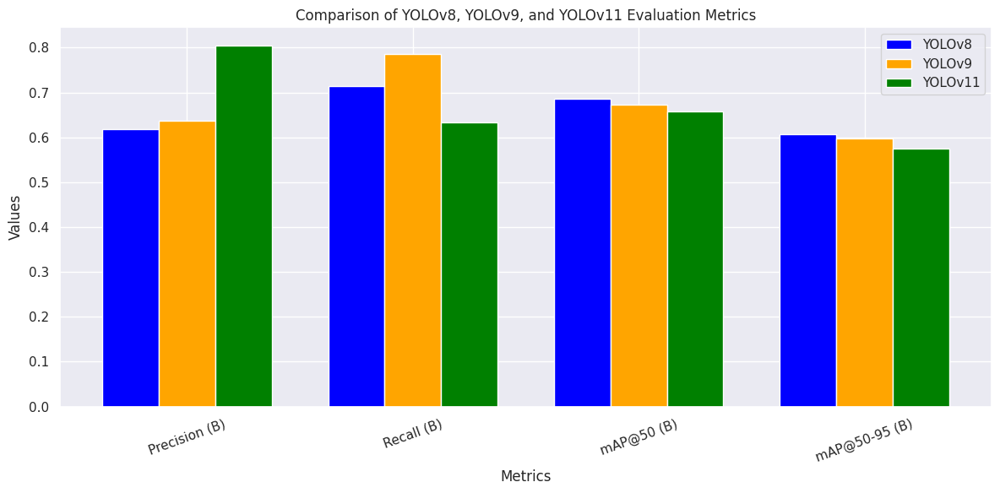

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the metrics (use the actual values from the evaluation results)
metrics_data = {
    "YOLOv8": {
        "Precision (B)": metrics_v8.results_dict["metrics/precision(B)"],
        "Recall (B)": metrics_v8.results_dict["metrics/recall(B)"],
        "mAP@50 (B)": metrics_v8.results_dict["metrics/mAP50(B)"],
        "mAP@50-95 (B)": metrics_v8.results_dict["metrics/mAP50-95(B)"]
    },
    "YOLOv9": {
        "Precision (B)": metrics_v9.results_dict["metrics/precision(B)"],
        "Recall (B)": metrics_v9.results_dict["metrics/recall(B)"],
        "mAP@50 (B)": metrics_v9.results_dict["metrics/mAP50(B)"],
        "mAP@50-95 (B)": metrics_v9.results_dict["metrics/mAP50-95(B)"]
    },
    "YOLOv11": {
        "Precision (B)": metrics_v11.results_dict["metrics/precision(B)"],
        "Recall (B)": metrics_v11.results_dict["metrics/recall(B)"],
        "mAP@50 (B)": metrics_v11.results_dict["metrics/mAP50(B)"],
        "mAP@50-95 (B)": metrics_v11.results_dict["metrics/mAP50-95(B)"]
    }
}

# Extract metric names and values
metric_names = list(metrics_data["YOLOv8"].keys())
yolo_v8_values = [metrics_data["YOLOv8"][metric] for metric in metric_names]
yolo_v9_values = [metrics_data["YOLOv9"][metric] for metric in metric_names]
yolo_v11_values = [metrics_data["YOLOv11"][metric] for metric in metric_names]

# Create a bar plot
x = np.arange(len(metric_names))  # X-axis positions
width = 0.25  # Width of the bars

plt.figure(figsize=(12, 6))
plt.bar(x - width, yolo_v8_values, width, label='YOLOv8', color='blue')
plt.bar(x, yolo_v9_values, width, label='YOLOv9', color='orange')  # Adding YOLOv9
plt.bar(x + width, yolo_v11_values, width, label='YOLOv11', color='green')

# Add labels, title, and legend
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Comparison of YOLOv8, YOLOv9, and YOLOv11 Evaluation Metrics')
plt.xticks(x, metric_names, rotation=20)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()

# Visual inspection and use of fine-tund YOLOv8, YOLOv9 and YOLOv11 first-hand


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/normal-86-_png.rf.c1bd769b23f23d9f4f422bce29993348.jpg: 640x640 1 benign, 5.8ms
Speed: 1.5ms preprocess, 5.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


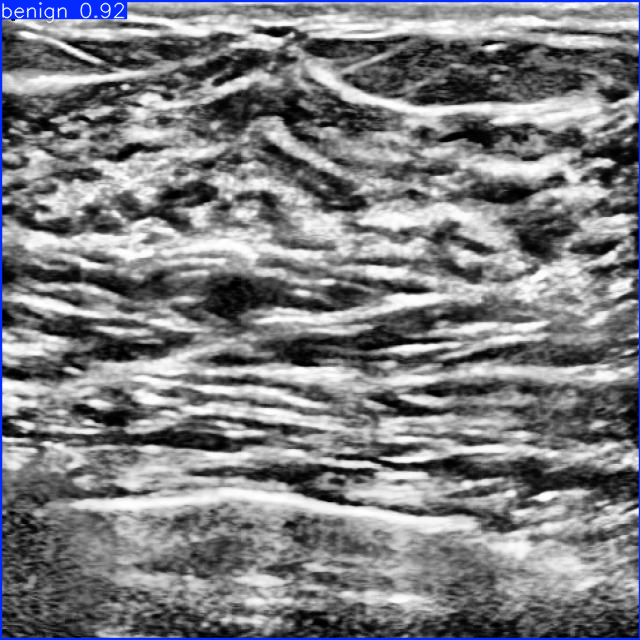


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/normal-86-_png.rf.c1bd769b23f23d9f4f422bce29993348.jpg: 640x640 1 benign, 23.9ms
Speed: 1.5ms preprocess, 23.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


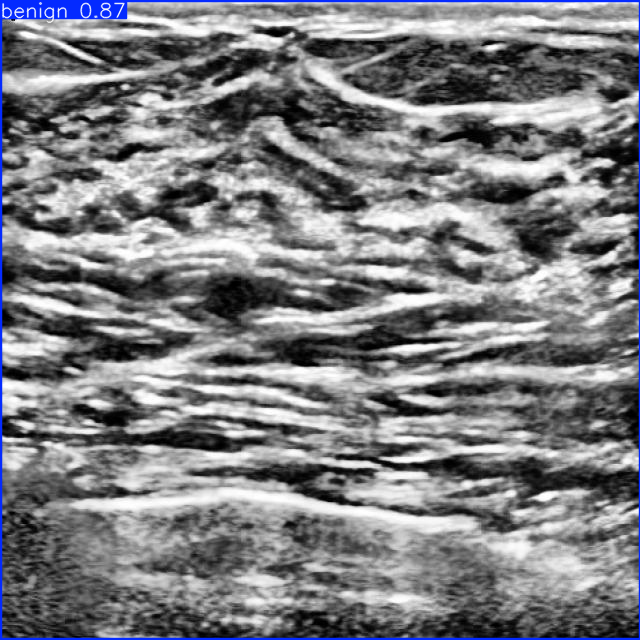


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/normal-86-_png.rf.c1bd769b23f23d9f4f422bce29993348.jpg: 640x640 1 benign, 8.4ms
Speed: 1.5ms preprocess, 8.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


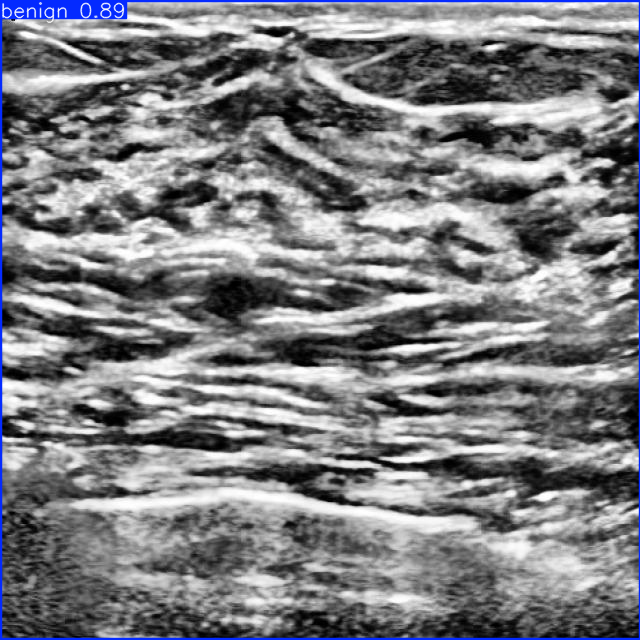


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/malignant-101-_png.rf.efcdaeab9ebbafcc50094cf980caa576.jpg: 640x640 1 benign, 6.4ms
Speed: 1.5ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/Breast-Cancer-1/test/images/malignant-101-_png.rf.efcdaeab9ebbafcc50094cf980caa576.jpg: 640x640 1 benign, 12.6ms
Speed: 1.9ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


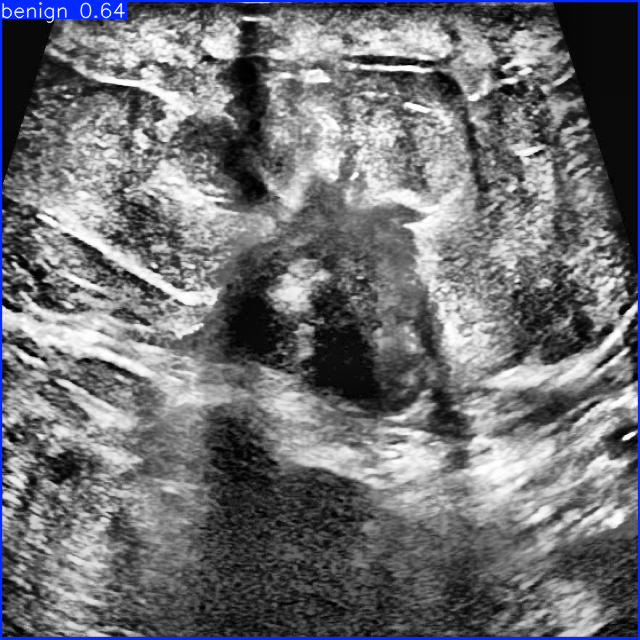


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/malignant-152-_png.rf.52e38982e66acd821d65c5b135f690bf.jpg: 640x640 1 benign, 6.4ms
Speed: 1.5ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


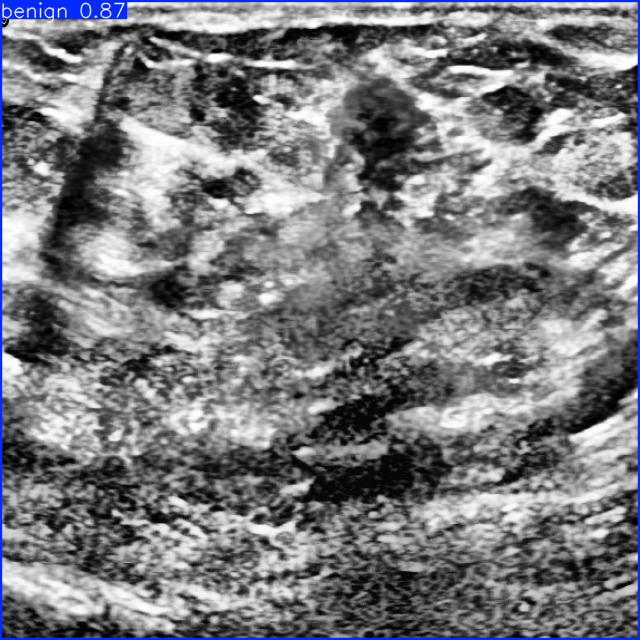


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/malignant-152-_png.rf.52e38982e66acd821d65c5b135f690bf.jpg: 640x640 1 benign, 23.8ms
Speed: 1.5ms preprocess, 23.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


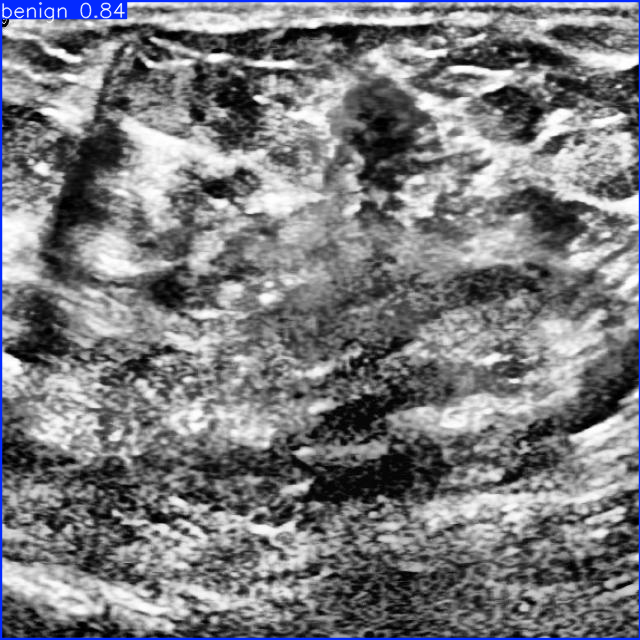


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/malignant-152-_png.rf.52e38982e66acd821d65c5b135f690bf.jpg: 640x640 1 benign, 8.9ms
Speed: 1.5ms preprocess, 8.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


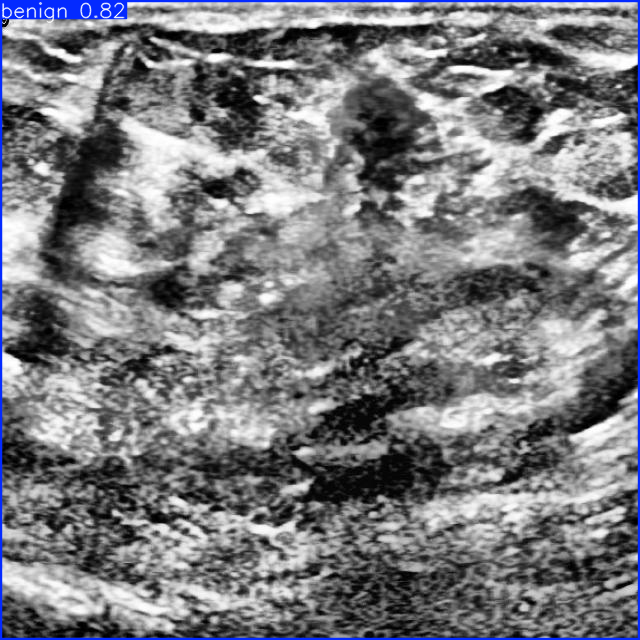


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/normal-46-_png.rf.0fb8f919ab0cb7e5979658ca0910d627.jpg: 640x640 1 benign, 6.4ms
Speed: 1.5ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


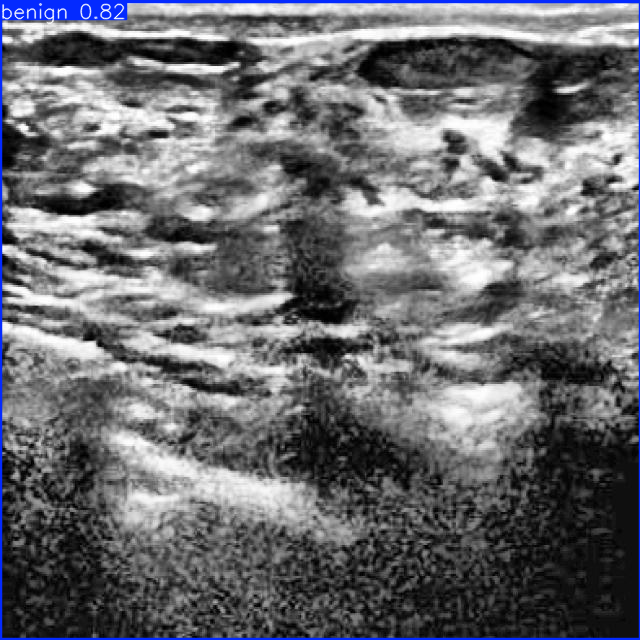


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/normal-46-_png.rf.0fb8f919ab0cb7e5979658ca0910d627.jpg: 640x640 1 benign, 23.7ms
Speed: 1.4ms preprocess, 23.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


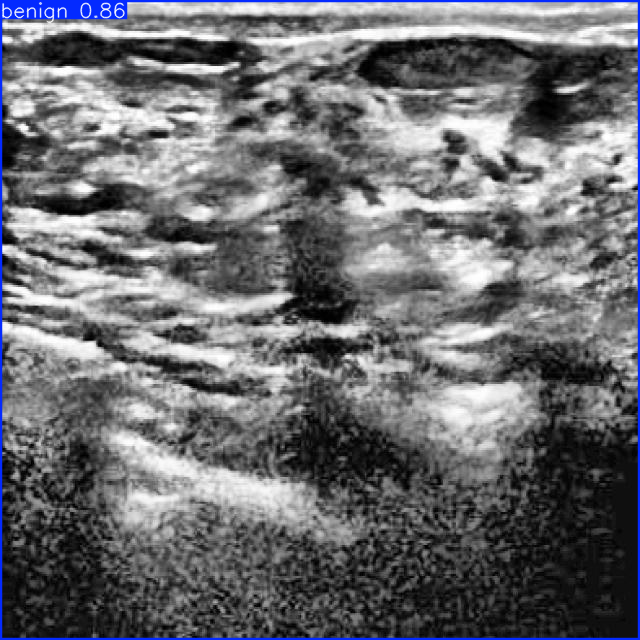


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/normal-46-_png.rf.0fb8f919ab0cb7e5979658ca0910d627.jpg: 640x640 1 benign, 8.9ms
Speed: 1.4ms preprocess, 8.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


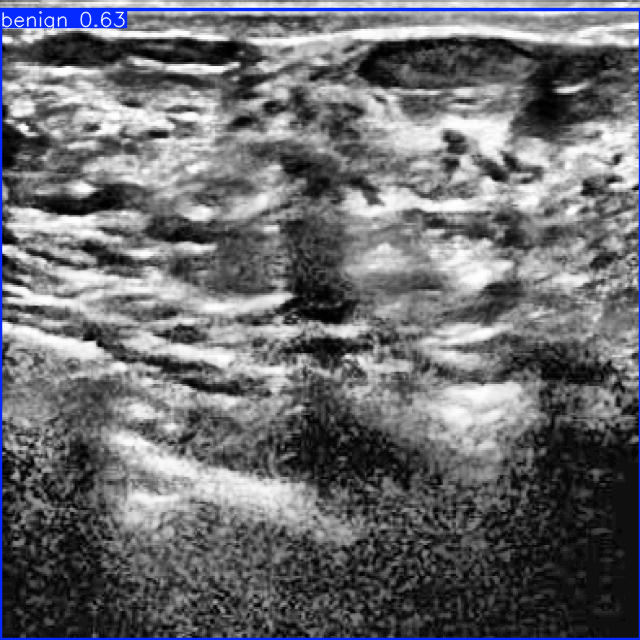


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/benign-116-_png.rf.df153f5f55f05f5c898c54631cff64b0.jpg: 640x640 1 benign, 6.9ms
Speed: 1.5ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


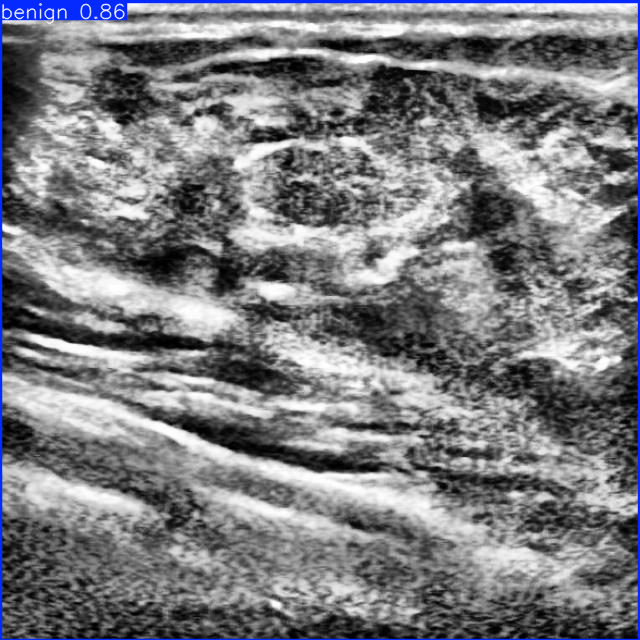


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/benign-116-_png.rf.df153f5f55f05f5c898c54631cff64b0.jpg: 640x640 1 benign, 23.8ms
Speed: 1.4ms preprocess, 23.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


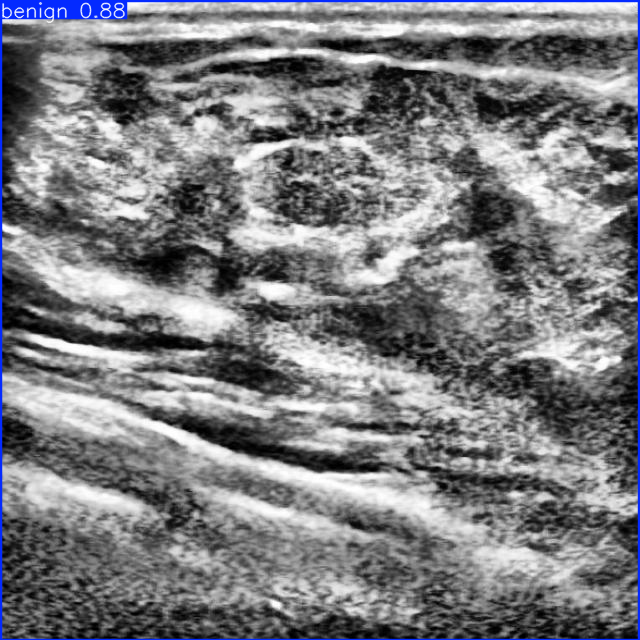


image 1/1 /kaggle/working/Breast-Cancer-1/test/images/benign-116-_png.rf.df153f5f55f05f5c898c54631cff64b0.jpg: 640x640 1 benign, 8.9ms
Speed: 1.5ms preprocess, 8.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


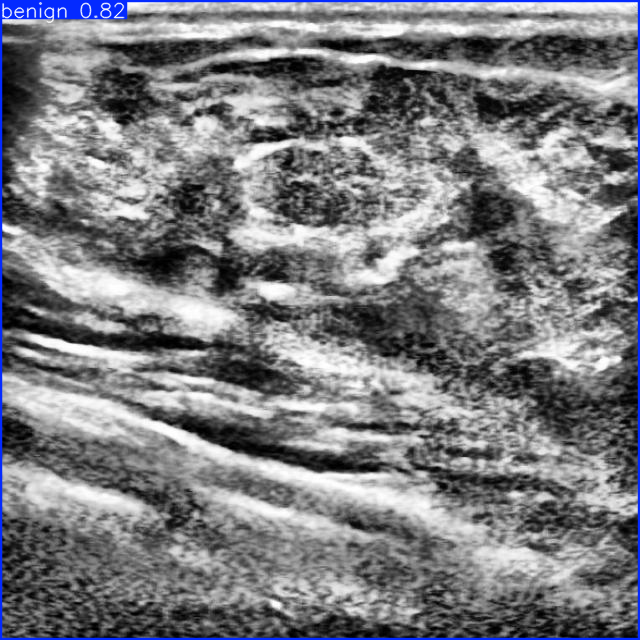

In [ ]:
import os
import cv2
from PIL import Image
from ultralytics import YOLO

# List of images in the test folder
images = os.listdir("/kaggle/working/Breast-Cancer-1/test/images")

# Load the trained models for YOLOv8, YOLOv9 (train2), and YOLOv11 (train3)
yolo_v8_model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')
yolo_v9_model = YOLO('/kaggle/working/runs/detect/train2/weights/best.pt')  # Using YOLOv9 from train2
yolo_v11_model = YOLO('/kaggle/working/runs/detect/train3/weights/best.pt')  # Using YOLOv11 from train3

# Predict and display results for YOLOv8, YOLOv9 (train2), and YOLOv11 (train3) for the first 5 images
for i in range(min(5, len(images))):  # Ensure that you do not exceed the number of available images
    # Get the image path
    image_path = os.path.join("/kaggle/working/Breast-Cancer-1/test/images", images[i])

    # Predict with YOLOv8 model
    result_v8 = yolo_v8_model.predict(source=image_path, imgsz=(640), iou=0.4)
    plot_v8 = result_v8[0].plot()  # Plot the YOLOv8 predictions
    plot_v8 = cv2.cvtColor(plot_v8, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    display(Image.fromarray(plot_v8))

    # Predict with YOLOv9 model (train2)
    result_v9 = yolo_v9_model.predict(source=image_path, imgsz=(640), iou=0.4)
    plot_v9 = result_v9[0].plot()  # Plot the YOLOv9 predictions
    plot_v9 = cv2.cvtColor(plot_v9, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    display(Image.fromarray(plot_v9))

    # Predict with YOLOv11 model (train3)
    result_v11 = yolo_v11_model.predict(source=image_path, imgsz=(640), iou=0.4)
    plot_v11 = result_v11[0].plot()  # Plot the YOLOv11 predictions
    plot_v11 = cv2.cvtColor(plot_v11, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    display(Image.fromarray(plot_v11))

# Conclusion

In the evaluation of the YOLOv8, YOLOv9, and YOLOv11 models for breast cancer classification, YOLOv8 achieved a balanced precision and recall, with a mAP@50 of 0.685. YOLOv9 slightly outperformed YOLOv8 with a mAP@50 of 0.672. However, YOLOv11 showed the highest precision (0.805) but lower recall (0.634) and mAP@50 (0.657). Overall, YOLOv8 and YOLOv9 perform better on recall, while YOLOv11 excels in precision.